# Classification 2 11/18/22

* improvements to classification methods explored in Classification 10/20/22

In [20]:
import json
import datetime
import pandas as pd
import numpy as np
import sys
import os

import plotly.express as px
import plotly.graph_objects as go

In [21]:
import seaborn as sns
import seaborn.objects as so
# Apply the default theme
sns.set_theme()
import matplotlib.pyplot as plt

# Functions

In [22]:
def str2dt(date):
    """Convert a string to a pandas timestamp object """
    return pd.to_datetime(date, format= '%Y, %m, %d, %H, %M' )

# Import Data 

In [23]:
df = pd.read_csv("../constants/td_ambient_102022.csv" )
df["DateTime"] = pd.to_datetime(df["DateTime"])
df.head()

,DateTime,Temp C,RH %,Room,Ambient Temp,Ambient RH,Window Open
0,2022-07-20 07:20:00,23.189,51.268,0,14.333333,30.555556,1
1,2022-07-20 07:20:30,23.189,51.362,0,14.333333,30.555556,1
2,2022-07-20 07:21:00,23.189,51.488,0,14.333333,30.555556,1
3,2022-07-20 07:21:30,23.189,51.457,0,14.333333,30.555556,1
4,2022-07-20 07:22:00,23.165,51.517,0,14.333333,30.555556,1


### experiments 

In [24]:
# get experminet end times 
with open('../constants/window_treatment.json') as f:    
    window_treatment = json.load(f)

exp_a_end = str2dt(window_treatment["072522"]["cutoff_times"]["end"])
exp_b_end = str2dt(window_treatment["081622"]["cutoff_times"]["end"])

In [25]:
# only consider experiments A and B 
df_ab = df.loc[df["DateTime"] < exp_b_end]
df_ab.head()

,DateTime,Temp C,RH %,Room,Ambient Temp,Ambient RH,Window Open
0,2022-07-20 07:20:00,23.189,51.268,0,14.333333,30.555556,1
1,2022-07-20 07:20:30,23.189,51.362,0,14.333333,30.555556,1
2,2022-07-20 07:21:00,23.189,51.488,0,14.333333,30.555556,1
3,2022-07-20 07:21:30,23.189,51.457,0,14.333333,30.555556,1
4,2022-07-20 07:22:00,23.165,51.517,0,14.333333,30.555556,1


## classify based on deviation from mean at time t => 
- T_a'(t) = T_a(t) - mean(T_a(t), T_b(t))
- T_b'(t) = T_b(t) - mean(T_a(t), T_b(t))

- plot all of these 
- look at distributions conditioned on open vs closed 
- classfiy, compare to just T 

In [35]:
df2 = pd.DataFrame()

In [36]:
df2["DateTime"] = df_ab.loc[df_ab["Room"] == 0]["DateTime"].reset_index(drop=True)
df2["Room 0 Temp C"] = df_ab.loc[df_ab["Room"] == 0]["Temp C"].reset_index(drop=True)
df2["Room 1 Temp C"] = df_ab.loc[df_ab["Room"] == 1]["Temp C"].reset_index(drop=True)



In [37]:
df2["mean Temp C"] = df2.mean(axis=1, numeric_only=True)
df2

,DateTime,Room 0 Temp C,Room 1 Temp C,mean Temp C
0,2022-07-20 07:20:00,23.189,23.453,23.321
1,2022-07-20 07:20:30,23.189,23.453,23.321
2,2022-07-20 07:21:00,23.189,23.453,23.321
3,2022-07-20 07:21:30,23.189,23.453,23.321
4,2022-07-20 07:22:00,23.165,23.453,23.309
...,...,...,...,...
53156,2022-08-10 19:57:30,25.847,26.139,25.993
53157,2022-08-10 19:58:00,25.847,26.115,25.981
53158,2022-08-10 19:58:30,25.847,26.115,25.981
53159,2022-08-10 19:59:00,25.847,26.115,25.981


In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df2["DateTime"],
    y=df2["Room 0 Temp C"],
    name="Room 0 Temp"
))
fig.add_trace(go.Scatter(
    x=df2["DateTime"],
    y=df2["Room 1 Temp C"],
    name="Room 1 Temp"
))
fig.add_trace(go.Scatter(
    x=df2["DateTime"],
    y=df2["mean Temp C"],
    name="Mean Temp"
))
# fig.add_trace(go.Scatter(
#     x=df0["DateTime"],
#     y=df0["Window Open Scaled"],
#     name="Recorded, 1 = Window Open",
#     line=dict(color='black', width=4)
# ))

# fig.add_trace(go.Scatter(
#     x=df0["DateTime"],
#     y=y_pred_scale,
#     name="Predicted",
#     line=dict(color='red', width=2, dash="dashdot")
# ))

fig.update_layout(title='Temperatures in Rooms and their Mean',
                   xaxis_title='Dates',
                   yaxis_title='Temperature (ºC)')

In [39]:
df2["Room 0 Window Open"] = df_ab.loc[df_ab["Room"] == 0]["Window Open"].reset_index(drop=True)
df2["Room 1 Window Open"] = df_ab.loc[df_ab["Room"] == 1]["Window Open"].reset_index(drop=True)

In [40]:
df2["Room 0 dT"] = df2["Room 0 Temp C"] - df2["mean Temp C"]
df2["Room 1 dT"] = df2["Room 1 Temp C"] - df2["mean Temp C"]

In [41]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df2["DateTime"],
    y=df2["Room 0 dT"],
    name="Room 0 Temp"
))
fig.add_trace(go.Scatter(
    x=df2["DateTime"],
    y=df2["Room 1 dT"],
    name="Room 1 Temp"
))
# fig.add_trace(go.Scatter(
#     x=df2["DateTime"],
#     y=df2["mean Temp C"],
#     name="Mean Temp"
# ))


fig.update_layout(title='Room Temperature Deltas',
                   xaxis_title='Dates',
                   yaxis_title='Temperature (ºC)')

In [42]:
df2.head()

,DateTime,Room 0 Temp C,Room 1 Temp C,mean Temp C,Room 0 Window Open,Room 1 Window Open,Room 0 dT,Room 1 dT
0,2022-07-20 07:20:00,23.189,23.453,23.321,1,0,-0.132,0.132
1,2022-07-20 07:20:30,23.189,23.453,23.321,1,0,-0.132,0.132
2,2022-07-20 07:21:00,23.189,23.453,23.321,1,0,-0.132,0.132
3,2022-07-20 07:21:30,23.189,23.453,23.321,1,0,-0.132,0.132
4,2022-07-20 07:22:00,23.165,23.453,23.309,1,0,-0.144,0.144


In [43]:
window_palette = {
    0: "green",
    1: "pink"
}

<AxesSubplot:xlabel='Room 1 dT', ylabel='Density'>

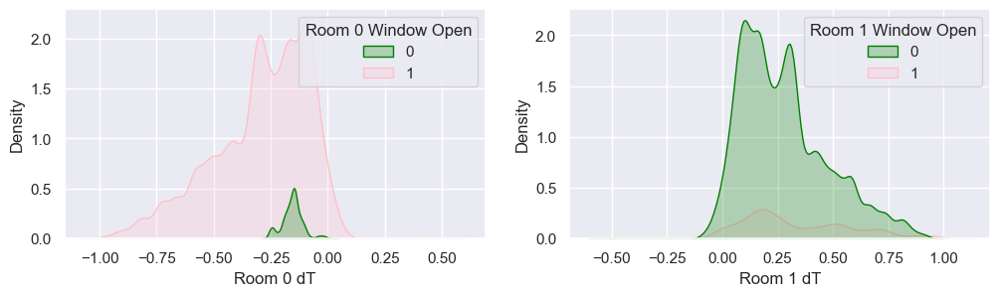

In [44]:
fig, axs = plt.subplots(1, 2,figsize=(12, 3))
sns.kdeplot(data=df2,  x="Room 0 dT", hue="Room 0 Window Open",  fill=True, palette=window_palette, ax=axs[0])
sns.kdeplot(data=df2,  x="Room 1 dT", hue="Room 1 Window Open",   fill=True, palette=window_palette, ax=axs[1])